In [1]:
pwd

'C:\\Users\\Dell'

In [6]:
cd downloads

C:\Users\Dell\downloads


In [4]:
ls

 Volume in drive C is OS
 Volume Serial Number is 04BF-48F9

 Directory of C:\Users\Dell\downloads

23-12-2019  00:08       136,316,289 #.zip
15-04-2020  12:40    <DIR>          .
15-04-2020  12:40    <DIR>          ..
08-04-2019  21:36    <DIR>          [FreeTutorials.Eu] Udemy - learn-data-structure-algorithms-with-java-interview
31-01-2019  05:22    <DIR>          [FreeTutorials.Eu] Udemy - php-for-complete-beginners-includes-msql-object-oriented
10-02-2019  19:36           174,897 __RESUME__.pdf
02-08-2019  22:50           335,977 135.png
02-08-2019  22:51            26,880 138.png
30-01-2019  17:31    <DIR>          2013-g7-ProjectFiles
17-01-2019  15:30    <DIR>          2015-g3-ProjectFiles
17-01-2019  15:30        16,817,718 2015-g3-ProjectFiles.zip
26-11-2018  12:20        28,468,910 4kvideodownloader_4.4.11_x64.zip
04-03-2019  20:19         1,062,022 556.pdf
03-04-2019  12:48            31,784 6CS119 Computer Networks (1).docx
03-04-2019  12:43            31,784 6CS119 Comput

In [7]:
cd character-extraction-master

C:\Users\Dell\downloads\character-extraction-master


In [8]:
cd character-extraction-master

C:\Users\Dell\downloads\character-extraction-master\character-extraction-master


In [8]:
ls

 Volume in drive C is OS
 Volume Serial Number is 04BF-48F9

 Directory of C:\Users\Dell\downloads\character-extraction-master\character-extraction-master

10-04-2020  11:01    <DIR>          .
10-04-2020  11:01    <DIR>          ..
10-04-2020  11:01               544 .gitignore
10-04-2020  11:01           917,048 730.txt
10-04-2020  11:01             6,924 characterExtraction.py
10-04-2020  11:01             2,129 customStopWords.txt
10-04-2020  11:01             3,305 README.md
10-04-2020  11:01            43,412 reviews.csv
10-04-2020  11:01           926,085 sentenceAnalysis.json
10-04-2020  11:01           925,938 sentenceAnalysis.txt
               8 File(s)      2,825,385 bytes
               2 Dir(s)  13,860,212,736 bytes free


In [18]:
import json
import nltk
import re

from collections import defaultdict
from nltk.corpus import stopwords
from pattern.en import parse, Sentence, mood
from pattern.db import csv
from pattern.vector import Document, NB

In [13]:
import nltk

In [19]:
def readText():
    """
    Reads the text from a text file.
    """
    with open("730.txt", "rb") as f:
        text = f.read().decode('utf-8-sig')
    return text

In [20]:
def chunkSentences(text):
    """
    Parses text into parts of speech tagged with parts of speech labels.

    Used for reference: https://gist.github.com/onyxfish/322906
    """
    sentences = nltk.sent_tokenize(text)
    tokenizedSentences = [nltk.word_tokenize(sentence)
                          for sentence in sentences]
    taggedSentences = [nltk.pos_tag(sentence)
                       for sentence in tokenizedSentences]
    if nltk.__version__[0:2] == "2.":
        chunkedSentences = nltk.batch_ne_chunk(taggedSentences, binary=True)
    else:
        chunkedSentences = nltk.ne_chunk_sents(taggedSentences, binary=True)
    return chunkedSentences

In [11]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [21]:
def extractEntityNames(tree, _entityNames=None):
    """
    Creates a local list to hold nodes of tree passed through, extracting named
    entities from the chunked sentences.

    Used for reference: https://gist.github.com/onyxfish/322906
    """
    if _entityNames is None:
        _entityNames = []
    try:
        if nltk.__version__[0:2] == "2.":
            label = tree.node
        else:
            label = tree.label()
    except AttributeError:
        pass
    else:
        if label == 'NE':
            _entityNames.append(' '.join([child[0] for child in tree]))
        else:
            for child in tree:
                extractEntityNames(child, _entityNames=_entityNames)
    return _entityNames

In [23]:
def buildDict(chunkedSentences, _entityNames=None):
    """
    Uses the global entity list, creating a new dictionary with the properties
    extended by the local list, without overwriting.

    Used for reference: https://gist.github.com/onyxfish/322906
    """
    if _entityNames is None:
        _entityNames = []

    for tree in chunkedSentences:
        extractEntityNames(tree, _entityNames=_entityNames)

    return _entityNames


In [14]:
nltk.download('maxent_ne_chunker')

[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping chunkers\maxent_ne_chunker.zip.


True

In [24]:
def removeStopwords(entityNames, customStopWords=None):
    """
    Brings in stopwords and custom stopwords to filter mismatches out.
    """
    # Memoize custom stop words
    if customStopWords is None:
        with open("customStopWords.txt", "rb") as f:
            customStopwords = f.read().split(', ')

    for name in entityNames:
        if name in stopwords.words('english') or name in customStopwords:
            entityNames.remove(name)

In [16]:
nltk.download('words')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\words.zip.


True

In [25]:
def getMajorCharacters(entityNames):
    """
    Adds names to the major character list if they appear frequently.
    """
    return {name for name in entityNames if entityNames.count(name) > 10}

In [26]:
def splitIntoSentences(text):
    """
    Split sentences on .?! "" and not on abbreviations of titles.
    Used for reference: http://stackoverflow.com/a/8466725
    """
    sentenceEnders = re.compile(r"""
    # Split sentences on whitespace between them.
    (?:               # Group for two positive lookbehinds.
      (?<=[.!?])      # Either an end of sentence punct,
    | (?<=[.!?]['"])  # or end of sentence punct and quote.
    )                 # End group of two positive lookbehinds.
    (?<!  Mr\.   )    # Don't end sentence on "Mr."
    (?<!  Mrs\.  )    # Don't end sentence on "Mrs."
    (?<!  Ms\.   )    # Don't end sentence on "Ms."
    (?<!  Jr\.   )    # Don't end sentence on "Jr."
    (?<!  Dr\.   )    # Don't end sentence on "Dr."
    (?<!  Prof\. )    # Don't end sentence on "Prof."
    (?<!  Sr\.   )    # Don't end sentence on "Sr."
    \s+               # Split on whitespace between sentences.
    """, re.IGNORECASE | re.VERBOSE)
    return sentenceEnders.split(text)

In [27]:
def compareLists(sentenceList, majorCharacters):
    """
    Compares the list of sentences with the character names and returns
    sentences that include names.
    """
    characterSentences = defaultdict(list)
    for sentence in sentenceList:
        for name in majorCharacters:
            if re.search(r"\b(?=\w)%s\b(?!\w)" % re.escape(name),
                         sentence,
                         re.IGNORECASE):
                characterSentences[name].append(sentence)
    return characterSentences


In [113]:
def extractMood(characterSentences):
    """
    Analyzes the sentence using grammatical mood module from pattern.
    """
    characterMoods = defaultdict(list)
    for key, value in characterSentences.items():
        for x in value:
            characterMoods[key].append(mood(Sentence(parse(str(x),
                                                           lemmata=True))))
    return characterMoods

In [123]:
for key, value in characterSentences.items():
        for x in value:
            characterMoods[key].append(mood(Sentence(parse(str(x)))))
            

In [124]:
characterMoods

defaultdict(list,
            {'Oliver': ['indicative',
              'indicative',
              'conditional',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'conditional',
              'conditional',
              'conditional',
              'indicative',
              'conditional',
              'indicative',
              'conditional',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'conditional',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'indicative',
              'conditional',
              'indicative',
              'indicative',
              'indicative',
              'conditional',
              'indicative',
              'indicative',
              'conditional',
          

In [115]:
characterMoods = defaultdict(list)
for key, value in characterSentences.items():

In [109]:
def extractSentiment(characterSentences):
    """
    Trains a Naive Bayes classifier object with the reviews.csv file, analyzes
    the sentence, and returns the tone.
    """
    nb = NB()
    characterTones = defaultdict(list)
    for review, rating in csv("reviews.csv"):
        nb.train(Document(review, type=int(rating), stopwords=True))
    for key, value in characterSentences.items():
        for x in value:
            characterTones[key].append(nb.classify(str(x)))
    return characterTones

In [30]:
def writeAnalysis(sentenceAnalysis):
    """
    Writes the sentence analysis to a text file in the same directory.
    """
    with open("sentenceAnalysis.txt", "wb") as f:
        for item in sentenceAnalysis.items():
            f.write("%s:%s\n" % item)


In [31]:
def writeToJSON(sentenceAnalysis):
    """
    Writes the sentence analysis to a JSON file in the same directory.
    """
    with open("sentenceAnalysis.json", "wb") as f:
        json.dump(sentenceAnalysis, f)

In [32]:
text = readText()

In [33]:
text

'The Project Gutenberg EBook of Oliver Twist, by Charles Dickens\n\nThis eBook is for the use of anyone anywhere at no cost and with\nalmost no restrictions whatsoever.  You may copy it, give it away or\nre-use it under the terms of the Project Gutenberg License included\nwith this eBook or online at www.gutenberg.net\n\n\nTitle: Oliver Twist\n\nAuthor: Charles Dickens\n\nPosting Date: October 10, 2008 [EBook #730]\nRelease Date: November, 1996\n\nLanguage: English\n\n\n*** START OF THIS PROJECT GUTENBERG EBOOK OLIVER TWIST ***\n\n\n\n\nProduced by Peggy Gaugy and Leigh Little.  HTML version by Al Haines.\n\n\n\n\n\n\n\n\n\nOLIVER TWIST\n\nOR\n\nTHE PARISH BOY\'S PROGRESS\n\n\nBY\n\nCHARLES DICKENS\n\n\n\n\nCONTENTS\n\n       I  TREATS OF THE PLACE WHERE OLIVER TWIST WAS BORN AND OF THE\n          CIRCUMSTANCES ATTENDING HIS BIRTH\n      II  TREATS OF OLIVER TWIST\'S GROWTH, EDUCATION, AND BOARD\n     III  RELATES HOW OLIVER TWIST WAS VERY NEAR GETTING A PLACE WHICH\n          WOULD NO

In [34]:
chunkedSentences = chunkSentences(text)

In [35]:
chunkedSentences

<generator object ParserI.parse_sents.<locals>.<genexpr> at 0x000001AF10F219A8>

In [36]:
entityNames = buildDict(chunkedSentences)

In [40]:
len(entityNames)

4414

In [41]:
entNames = list(set(entityNames))
print(entNames) 
len(entNames)

['Agnes Fleming', 'Redistribution', 'Exmouth Street', 'BUSINESS Oliver', 'PERFORMED', 'Midnight', 'LIII AND', 'Master', 'XXVI IN', 'Mr. Sikes', 'CHAPTER XXV', 'REFUND', 'CHAPTER XIII', 'STRANGE INTERVIEW', 'Kiss', 'Such', 'Move', 'Bedwin', 'Bleak', 'AND BOARD', 'Jack Dawkins', 'Child', 'Commons', 'Deep', 'Bah', 'BROWNLOW AT', 'LIKE MISFORTUNES', 'Think', 'Chester', 'Sundays', 'Becky', 'Joe', 'Nobody', 'Little Oliver', 'Remain', 'Hark', 'Merry Old', 'Wot', 'Somebody', 'PLEASANT', 'CHAPTER IX', 'Lower Halliford', 'WILLIAM', 'Mr. Brownlow', 'WHICH', 'OLIVER', 'Mr. Grimwig', 'Sowerberry', 'CHAPTER XLV', 'Esquire', 'Trip', 'Artfull', 'XXXVI', 'Mr. Crackit', 'Harry Maylie', 'Lor', 'Master Charles Bates', 'Faguey', 'Betsy', 'LONDON', 'DESTINY', 'Mr. Fang', 'Farewell', 'Tom Chitling', 'Brownlow', 'Mr. Chitling', 'Inquisitive', 'Lie', '_Your_', 'Believe', 'AND THE', 'Flight', 'XXXIX', 'London', 'Angels', 'Geneva', 'Shoreditch', 'Death', 'Conkey Chickweed', 'CHAPTER III', 'Grimwig', 'XXXVII IN',

647

In [70]:
from nltk.corpus import stopwords
stoplist = stopwords.words('english')

In [71]:
stoplist

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [50]:
with open('customStopWords.txt') as stopfile:
    stopwords = stopfile.read()
    list1 = stopwords.split(',')
    print(list1)

['Street', ' Road', ' Bridge', ' Town', ' Park', ' Hill', ' Lane', ' CHAPTER', ' Chapter', ' CHAPTER I', ' CHAPTER II', ' CHAPTER III', ' CHAPTER IV', ' CHAPTER V', ' CHAPTER VI', ' CHAPTER VII', ' CHAPTER VIII', ' CHAPTER IX', ' CHAPTER X', ' CHAPTER XI', ' CHAPTER XII', ' CHAPTER XIII', ' CHAPTER XIV', ' CHAPTER XV', ' CHAPTER XVI', ' CHAPTER XVII', ' CHAPTER XVIII', ' CHAPTER XIX', ' CHAPTER XX', ' CHAPTER XXI', ' CHAPTER XXII', ' CHAPTER XXIII', ' CHAPTER XXIV', ' CHAPTER XXV', ' CHAPTER XXVI', ' CHAPTER XXVII', ' CHAPTER XXVIII', ' CHAPTER XXIX', ' CHAPTER XXX', ' CHAPTER XXXI', ' CHAPTER XXXII', ' CHAPTER XXXIII', ' CHAPTER XXXIV', ' CHAPTER XXXV', ' CHAPTER XXXVI', ' CHAPTER XXXVII', ' CHAPTER XXXVIII', ' CHAPTER XXXIX', ' CHAPTER XL', ' CHAPTER XLI', ' CHAPTER XLII', ' CHAPTER XLIII', ' CHAPTER XLIV', ' CHAPTER XLV', ' CHAPTER XLVI', ' CHAPTER XLVII', ' CHAPTER XLVIII', ' CHAPTER XLIX', ' CHAPTER L', ' CHAPTER LI', ' CHAPTER LII', ' CHAPTER LIII', ' CHAPTER LIV', ' CHAPTER LV',

In [62]:
for name in entityNames:
        if name in list1:
            entityNames.remove(name)

In [63]:
for name in entNames:
        if name in list1:
            entNames.remove(name)

In [64]:
entNames

['Agnes Fleming',
 'Redistribution',
 'Exmouth Street',
 'BUSINESS Oliver',
 'PERFORMED',
 'Midnight',
 'LIII AND',
 'Master',
 'XXVI IN',
 'Mr. Sikes',
 'CHAPTER XXV',
 'REFUND',
 'CHAPTER XIII',
 'STRANGE INTERVIEW',
 'Kiss',
 'Such',
 'Move',
 'Bedwin',
 'Bleak',
 'AND BOARD',
 'Jack Dawkins',
 'Child',
 'Commons',
 'Deep',
 'Bah',
 'BROWNLOW AT',
 'LIKE MISFORTUNES',
 'Think',
 'Chester',
 'Sundays',
 'Becky',
 'Joe',
 'Nobody',
 'Little Oliver',
 'Remain',
 'Hark',
 'Merry Old',
 'Wot',
 'Somebody',
 'PLEASANT',
 'CHAPTER IX',
 'Lower Halliford',
 'WILLIAM',
 'Mr. Brownlow',
 'WHICH',
 'OLIVER',
 'Mr. Grimwig',
 'Sowerberry',
 'CHAPTER XLV',
 'Esquire',
 'Trip',
 'Artfull',
 'XXXVI',
 'Mr. Crackit',
 'Harry Maylie',
 'Lor',
 'Master Charles Bates',
 'Faguey',
 'Betsy',
 'LONDON',
 'DESTINY',
 'Mr. Fang',
 'Farewell',
 'Tom Chitling',
 'Brownlow',
 'Mr. Chitling',
 'Inquisitive',
 'Lie',
 '_Your_',
 'Believe',
 'AND THE',
 'Flight',
 'XXXIX',
 'London',
 'Angels',
 'Geneva',
 'Shor

In [65]:
len(entNames)

647

In [76]:
for name in entityNames:
        if name in stoplist:
            print(name)
            entityNames.remove(name)

In [77]:
len(entityNames)

4414

In [78]:
for name in entNames:
        if name in stoplist:
            print(name)
            entNames.remove(name)

In [79]:
 majorCharacters = getMajorCharacters(entityNames)

In [84]:
 majorCharacters

{'AND',
 'Artful',
 'Barney',
 'Bill',
 'Blathers',
 'Brittles',
 'Bumble',
 'CHAPTER',
 'Charley',
 'Charley Bates',
 'Charlotte',
 'Chertsey',
 'Come',
 'Dodger',
 'Duff',
 'Fagin',
 'Giles',
 'God',
 'Harry',
 'Harry Maylie',
 'Heaven',
 'Jew',
 'London',
 'Master Bates',
 'Monks',
 'Mr.',
 'Mr. Bolter',
 'Mr. Brownlow',
 'Mr. Bumble',
 'Mr. Chitling',
 'Mr. Claypole',
 'Mr. Dawkins',
 'Mr. Fagin',
 'Mr. Fang',
 'Mr. Gamfield',
 'Mr. Giles',
 'Mr. Grimwig',
 'Mr. Limbkins',
 'Mr. Losberne',
 'Mr. Sikes',
 'Mr. Sowerberry',
 'Nancy',
 'Noah',
 'Noah Claypole',
 'Oliver',
 'Oliver Twist',
 'Project',
 'Rose',
 'Sikes',
 'Sowerberry',
 'THE',
 'Toby',
 'Toby Crackit',
 'Tom',
 'WHICH'}

In [83]:
print(majorCharacters)
len(majorCharacters)
type(majorCharacters)
len(majorCharacters)


{'Rose', 'Charlotte', 'Mr. Brownlow', 'WHICH', 'Sowerberry', 'Mr. Grimwig', 'Barney', 'Monks', 'Blathers', 'AND', 'Noah Claypole', 'Toby Crackit', 'Mr. Giles', 'Come', 'Mr. Fagin', 'Charley', 'Duff', 'Harry Maylie', 'Harry', 'Master Bates', 'Brittles', 'Oliver', 'Bumble', 'Artful', 'Mr. Fang', 'Mr. Bolter', 'Heaven', 'Mr. Sikes', 'Chertsey', 'Giles', 'Charley Bates', 'Noah', 'Mr. Chitling', 'Mr. Gamfield', 'Bill', 'Fagin', 'Mr. Dawkins', 'Sikes', 'Mr. Losberne', 'Mr. Limbkins', 'Dodger', 'Mr. Claypole', 'Jew', 'Project', 'CHAPTER', 'London', 'Mr. Sowerberry', 'Tom', 'God', 'Mr. Bumble', 'THE', 'Mr.', 'Nancy', 'Oliver Twist', 'Toby'}


55

In [85]:
additional_stopwords = """AND THE WHICH Mr."""

# Split the the additional stopwords string on each word and then add
# those words to the NLTK stopwords list
stoplist += additional_stopwords.split()

In [96]:
type(majorCharacters)
s=list(majorCharacters)

In [99]:
majCharacters=set(s)

In [98]:
for name in s:
    if name in stoplist:
        s.remove(name)

In [100]:
majCharacters

{'Artful',
 'Barney',
 'Bill',
 'Blathers',
 'Brittles',
 'Bumble',
 'CHAPTER',
 'Charley',
 'Charley Bates',
 'Charlotte',
 'Chertsey',
 'Come',
 'Dodger',
 'Duff',
 'Fagin',
 'Giles',
 'God',
 'Harry',
 'Harry Maylie',
 'Heaven',
 'Jew',
 'London',
 'Master Bates',
 'Monks',
 'Mr. Bolter',
 'Mr. Brownlow',
 'Mr. Bumble',
 'Mr. Chitling',
 'Mr. Claypole',
 'Mr. Dawkins',
 'Mr. Fagin',
 'Mr. Fang',
 'Mr. Gamfield',
 'Mr. Giles',
 'Mr. Grimwig',
 'Mr. Limbkins',
 'Mr. Losberne',
 'Mr. Sikes',
 'Mr. Sowerberry',
 'Nancy',
 'Noah',
 'Noah Claypole',
 'Oliver',
 'Oliver Twist',
 'Project',
 'Rose',
 'Sikes',
 'Sowerberry',
 'Toby',
 'Toby Crackit',
 'Tom'}

In [101]:
sentenceList = splitIntoSentences(text)

In [103]:
characterSentences = compareLists(sentenceList, majCharacters)

In [110]:
 characterTones = extractSentiment(characterSentences)

In [125]:
sentenceAnalysis = defaultdict(list,
                                   [(k, [characterSentences[k],
                                         characterTones[k],
                                         characterMoods[k]])
                                    for k in characterSentences])

In [126]:
sentenceAnalysis

defaultdict(list,
            {'Oliver': [['The Project Gutenberg EBook of Oliver Twist, by Charles Dickens\n\nThis eBook is for the use of anyone anywhere at no cost and with\nalmost no restrictions whatsoever.',
               'You may copy it, give it away or\nre-use it under the terms of the Project Gutenberg License included\nwith this eBook or online at www.gutenberg.net\n\n\nTitle: Oliver Twist\n\nAuthor: Charles Dickens\n\nPosting Date: October 10, 2008 [EBook #730]\nRelease Date: November, 1996\n\nLanguage: English\n\n\n*** START OF THIS PROJECT GUTENBERG EBOOK OLIVER TWIST ***\n\n\n\n\nProduced by Peggy Gaugy and Leigh Little.',
               "OLIVER TWIST\n\nOR\n\nTHE PARISH BOY'S PROGRESS\n\n\nBY\n\nCHARLES DICKENS\n\n\n\n\nCONTENTS\n\n       I  TREATS OF THE PLACE WHERE OLIVER TWIST WAS BORN AND OF THE\n          CIRCUMSTANCES ATTENDING HIS BIRTH\n      II  TREATS OF OLIVER TWIST'S GROWTH, EDUCATION, AND BOARD\n     III  RELATES HOW OLIVER TWIST WAS VERY NEAR GETTING A PL

In [129]:
with open("sentenceAnalysis1.txt", "w") as f:
        for item in sentenceAnalysis.items():
            f.write("%s:%s\n" % item)

In [133]:
with open("sentenceAnalysis.json", "w") as f:
        json.dump(sentenceAnalysis, f)

In [141]:
from bookworm import *

In [140]:
!pip install python-louvain

  Stored in directory: C:\Users\Dell\AppData\Local\pip\Cache\wheels\e7\8d\24\6b3a464bb23e96ecba3f68868e85721534fd8158a9cd7b426b
Successfully built python-louvain


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [137]:
!pip install spacy

  Found existing installation: tqdm 4.26.0
    Uninstalling tqdm-4.26.0:
      Successfully uninstalled tqdm-4.26.0


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [226]:
book = load_book('730.txt', lower=True)

In [227]:
book

'ï»¿the project gutenberg ebook of oliver twist, by charles dickens\n\nthis ebook is for the use of anyone anywhere at no cost and with\nalmost no restrictions whatsoever.  you may copy it, give it away or\nre-use it under the terms of the project gutenberg license included\nwith this ebook or online at www.gutenberg.net\n\n\ntitle: oliver twist\n\nauthor: charles dickens\n\nposting date: october 10, 2008 [ebook #730]\nrelease date: november, 1996\n\nlanguage: english\n\n\n*** start of this project gutenberg ebook oliver twist ***\n\n\n\n\nproduced by peggy gaugy and leigh little.  html version by al haines.\n\n\n\n\n\n\n\n\n\noliver twist\n\nor\n\nthe parish boy\'s progress\n\n\nby\n\ncharles dickens\n\n\n\n\ncontents\n\n       i  treats of the place where oliver twist was born and of the\n          circumstances attending his birth\n      ii  treats of oliver twist\'s growth, education, and board\n     iii  relates how oliver twist was very near getting a place which\n          would

In [178]:

characters = s

In [179]:
characters

['Rose',
 'Charlotte',
 'Mr. Brownlow',
 'Sowerberry',
 'Mr. Grimwig',
 'Barney',
 'Monks',
 'Blathers',
 'Noah Claypole',
 'Toby Crackit',
 'Mr. Giles',
 'Come',
 'Mr. Fagin',
 'Charley',
 'Duff',
 'Harry Maylie',
 'Harry',
 'Master Bates',
 'Brittles',
 'Oliver',
 'Bumble',
 'Artful',
 'Mr. Fang',
 'Mr. Bolter',
 'Heaven',
 'Mr. Sikes',
 'Chertsey',
 'Giles',
 'Charley Bates',
 'Noah',
 'Mr. Chitling',
 'Mr. Gamfield',
 'Bill',
 'Fagin',
 'Mr. Dawkins',
 'Sikes',
 'Mr. Losberne',
 'Mr. Limbkins',
 'Dodger',
 'Mr. Claypole',
 'Jew',
 'Project',
 'CHAPTER',
 'London',
 'Mr. Sowerberry',
 'Tom',
 'God',
 'Mr. Bumble',
 'Nancy',
 'Oliver Twist',
 'Toby']

In [228]:
sequences = get_sentence_sequences(book)

In [325]:
type(sequences)

list

In [181]:
df = find_connections(sequences, characters)

In [183]:
cooccurence = calculate_cooccurence(df)

In [184]:
cooccurence

,Rose,Charlotte,Mr. Brownlow,Sowerberry,Mr. Grimwig,Barney,Monks,Blathers,Noah Claypole,Toby Crackit,...,Project,CHAPTER,London,Mr. Sowerberry,Tom,God,Mr. Bumble,Nancy,Oliver Twist,Toby
Rose,0,18935825,19519705,17232928,16383511,10655760,6533545,15722747,24928627,19616627,...,11537792,0,10298755,25517754,3114676,3741532,15370913,5788988,22825179,3395340
Charlotte,18935825,0,46501207,40943077,39127717,25413386,15434856,37600600,59519403,46929173,...,27517350,0,24448961,60714424,7371804,8869828,36622417,13860565,54456626,8045258
Mr. Brownlow,19519705,46501207,0,42295754,40699032,26192035,16052259,38479652,61484720,48564637,...,28282837,0,25480444,62884967,7699112,9232472,37900076,14325727,56232955,8398658
Sowerberry,17232928,40943077,42295754,0,35581247,23152539,13968562,33971196,53773182,42423893,...,24998449,0,22139431,55592388,6691545,8044740,33333954,12508854,49296215,7329365
Mr. Grimwig,16383511,39127717,40699032,35581247,0,22078958,13453743,32469383,51651900,41007023,...,23777014,0,21275280,52990115,6423363,7683843,31994362,12068701,47656790,6982425
Barney,10655760,25413386,26192035,23152539,22078958,0,8707117,21113301,33470443,26389951,...,15443731,0,13809863,34307656,4128205,4979030,20650652,7893175,30612527,4520167
Monks,6533545,15434856,16052259,13968562,13453743,8707117,0,12789792,20402937,16120379,...,9390515,0,8563766,20753350,2571301,3084574,12520184,4797322,18660381,2800071
Blathers,15722747,37600600,38479652,33971196,32469383,21113301,12789792,0,49331162,38850779,...,22763857,0,20174114,50370374,6064730,7313116,30397294,11501957,45210192,6620056
Noah Claypole,24928627,59519403,61484720,53773182,51651900,33470443,20402937,49331162,0,61926074,...,36043223,0,32339601,79934179,9762196,11740864,48351559,18352936,71727937,10670666
Toby Crackit,19616627,46929173,48564637,42423893,41007023,26389951,16120379,38850779,61926074,0,...,28488130,0,25523268,63140922,7701653,9237495,38145159,14500977,56750915,8424399


In [182]:
df

,Rose,Charlotte,Mr. Brownlow,Sowerberry,Mr. Grimwig,Barney,Monks,Blathers,Noah Claypole,Toby Crackit,...,Project,CHAPTER,London,Mr. Sowerberry,Tom,God,Mr. Bumble,Nancy,Oliver Twist,Toby
"""and oh, kind heaven!""",3,7,8,5,5,7,5,6,13,8,...,3,0,10,8,1,3,5,5,8,1
"""brittles,"" i says, when i had woke him, ""don't be frightened!""'",11,25,26,25,28,14,9,22,31,29,...,14,0,13,37,3,5,22,6,38,5
"""come!""",2,2,2,3,1,1,1,1,3,2,...,3,0,2,3,2,1,2,1,1,1
"""d--me!""",1,1,0,2,1,1,0,1,1,0,...,1,0,1,2,1,1,2,0,1,0
"""don't go to him,"" i called out of the window, ""he's an assassin!",14,26,34,14,24,11,15,21,42,31,...,14,0,23,26,7,9,19,9,36,6
"""have you?""",2,4,3,4,1,3,1,3,8,4,...,2,0,2,5,1,1,3,2,3,2
"""i see him, spyers,"" said chickweed, ""pass my house yesterday morning,""\n""why didn't you up, and collar him!""",20,32,42,40,45,27,17,34,60,48,...,21,0,22,60,8,10,37,18,56,10
"""i was so struck all\nof a heap, that you might have fractured my skull with a toothpick,""\nsays the poor man; ""but we're sure to have him; for between ten and\neleven o'clock at night he passed again.""",37,98,93,75,75,50,31,81,136,105,...,55,0,39,118,15,14,78,31,110,16
"""in\nshort, fagin,"" he says, ""jew as you are, you never laid such snares as\ni'll contrive for my young brother, oliver.""'",25,47,66,60,54,36,22,44,75,60,...,32,0,29,89,9,9,48,20,68,14
"""my heart!""",1,6,3,6,4,4,0,5,6,5,...,3,0,0,8,1,0,4,2,4,1


In [153]:
cooccurence = cooccurence.to_sparse()

In [156]:
def print_five_closest(character):
    print('-'*len(str(character))
          + '\n' + str(character) + '\n'
          + '-'*len(str(character)))
    
    top_five = (cooccurence[str(character)]
                .sort_values(ascending=False)
                .index.values
                [:5])
    
    for name in top_five:
        print(name)

In [157]:
from random import randint

for i in range(5):
    print_five_closest(characters[randint(0, len(characters))])
    print()

---------
Mr. Fagin
---------
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Mr. Losberne

-----
Harry
-----
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Mr. Losberne

------------
Oliver Twist
------------
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Mr. Losberne

------
Bumble
------
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Mr. Losberne

-----
Fagin
-----
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Mr. Losberne



In [158]:
print_five_closest('Mr. Losberne')

------------
Mr. Losberne
------------
Master Bates
Charley Bates
Mr. Sowerberry
Noah Claypole
Harry Maylie


In [186]:
from bookworm import *

In [191]:
!pip install spacy

You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [196]:
import networkx as nx

import spacy
import nltk
import string

In [257]:
len(book.split())

161009

In [286]:
chunkedSentences = chunkSentences(text)

In [287]:
entityNames2 = buildDict(chunkedSentences)

In [291]:
len(entityNames2)
len(words3)

5736

In [290]:
words3 = [remove_punctuation(p) for p in entityNames2]

In [304]:
words3

['THE BOY',
 'Privet Drive',
 'Mr Dursley',
 'Grunnings',
 'Dursley',
 'Dudley',
 'Dursleys',
 'Harry Potter',
 'Philosophers Stone',
 'unDursleyish',
 'Dursleys',
 'Potters',
 'Dursleys',
 'Potters',
 'Dudley',
 'Mr Dursley',
 'Dudley',
 'None',
 'Mr Dursley',
 'Dudley',
 'Dudley',
 'Mr Dursley',
 'Mr Dursley',
 'Privet Drive',
 'Mr Dursley',
 'Page',
 'Harry Potter',
 'Philosophers Stone',
 'Mr Dursley',
 'Privet Drive',
 'Mr Dursley',
 'Mr Dursley',
 'Mr Dursley',
 'Mr Dursley',
 'Mr Dursley',
 'Grunnings',
 'Mr Dursley',
 'Mr Dursley',
 'Harry Potter',
 'Philosophers Stone',
 'Potters',
 'Harry',
 'Fear',
 'Potter',
 'Harry',
 'Come',
 'Harry',
 'Harvey',
 'Harold',
 'Page',
 'Harry Potter',
 'Philosophers Stone',
 'Sorry',
 'Mr Dursley',
 'Rejoice',
 'Mr Dursley',
 'Mr Dursley',
 'Muggle',
 'Mr Dursley',
 'Was',
 'Mr Dursley',
 'Page',
 'Harry Potter',
 'Philosophers Stone',
 'Dudley',
 'Mr Dursley',
 'Dudley',
 'Jim',
 'Jim',
 'Ted',
 'Kent',
 'Yorkshire',
 'Dundee',
 'Bonfire Ni

In [265]:
remove_punctuation = lambda s: s.translate(str.maketrans('', '', string.punctuation+'’'))
words = [remove_punctuation(p) for p in book.split()]

#unique_words = list(set(words))
#len(unique_words)
len(words)

161009

In [212]:
!python -m spacy download en

[+] Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
[x] Couldn't link model to 'en'
Creating a symlink in spacy/data failed. Make sure you have the required
permissions and try re-running the command as admin, or use a virtualenv. You
can still import the model as a module and call its load() method, or create the
symlink manually.
C:\Users\Dell\Anaconda3\lib\site-packages\en_core_web_sm -->
C:\Users\Dell\Anaconda3\lib\site-packages\spacy\data\en
[!] Download successful but linking failed
Creating a shortcut link for 'en' didn't work (maybe you don't have admin
permissions?), but you can still load the model via its full package name: nlp =
spacy.load('en_core_web_sm')


You should consider upgrading via the 'python -m pip install --upgrade pip' command.
You do not have sufficient privilege to perform this operation.


In [231]:
import spacy
import en_core_web_sm
nlp = en_core_web_sm.load()

In [293]:
char=[word.text for word in nlp(' '.join(words3)) if word.pos_ == 'PROPN']
len(char)

6966

In [266]:
candidates = [word.text for word in nlp(' '.join(words)) if word.pos_ == 'PROPN']
len(candidates)

6349

In [267]:
candidates = [c for c in candidates if len(c) > 2]
len(candidates)

5201

In [294]:
char = [c for c in char if len(c) > 2]
len(char)

6890

In [262]:
candidates

['project',
 'gutenberg',
 'ebook',
 'oliver',
 'twist',
 'charles',
 'gutenberg',
 'wwwgutenbergnet',
 'title',
 'oliver',
 'twist',
 'charles',
 'october',
 'november',
 'gutenberg',
 'ebook',
 'oliver',
 'twist',
 'peggy',
 'gaugy',
 'leigh',
 'html',
 'haines',
 'oliver',
 'twist',
 'charles',
 'dickens',
 'oliver',
 'twist',
 'oliver',
 'twists',
 'iii',
 'oliver',
 'twist',
 'oliver',
 'oliver',
 'business',
 'oliver',
 'noah',
 'vii',
 'oliver',
 'refractory',
 'viii',
 'oliver',
 'london',
 'oliver',
 'fang',
 'justice',
 'xii',
 'oliver',
 'gentleman',
 'xiv',
 'grimwig',
 'oliver',
 'twist',
 'jew',
 'miss',
 'nancy',
 'xvi',
 'oliver',
 'nancy',
 'xvii',
 'london',
 'xviii',
 'oliver',
 'xix',
 'oliver',
 'william',
 'sikes',
 'bumble',
 'xxiv',
 'fagin',
 'xxvi',
 'xxviii',
 'oliver',
 'oliver',
 'xxx',
 'xxxi',
 'happy',
 'life',
 'oliver',
 'oliver',
 'xxxiv',
 'oliver',
 'xxxv',
 'harry',
 'maylie',
 'xxxvi',
 'mrs',
 'bumble',
 'xxxix',
 'jew',
 'metropolis',
 'nancy',


In [320]:
text

'/ \n\n\n\n\nTHE BOY WHO LIVED \n\nMr. and Mrs. Dursley, of number four, Privet Drive, \nwere proud to say that they were perfectly normal, \nthank you very much. They were the last people you’d \nexpect to be involved in anything strange or \nmysterious, because they just didn’t hold with such \nnonsense. \n\nMr. Dursley was the director of a firm called \nGrunnings, which made drills. He was a big, beefy \nman with hardly any neck, although he did have a \nvery large mustache. Mrs. Dursley was thin and \nblonde and had nearly twice the usual amount of \nneck, which came in very useful as she spent so \nmuch of her time craning over garden fences, spying \non the neighbors. The Dursley s had a small son \ncalled Dudley and in their opinion there was no finer \nboy anywhere. \n\nThe Dursleys had everything they wanted, but they \nalso had a secret, and their greatest fear was that \nsomebody would discover it. They didn’t think they \ncould bear it if anyone found out about the Potters

In [215]:
candidates = [c for c in candidates if c.istitle()]
len(candidates)

0

In [297]:
char = [c for c in char if c.istitle()]
len(char)

6790

In [268]:
candidates = [c for c in candidates if not (c[-1] == 's' and c[:-1] in candidates)]
len(candidates)

5054

In [298]:
char = [c for c in char if not (c[-1] == 's' and c[:-1] in char)]
len(char)

6694

In [269]:
 majorCharacters2 = getMajorCharacters(candidates)

In [299]:
 majorCharacters3 = getMajorCharacters(char)
    

In [357]:
def getMajorCharacters(entityNames):
    """
    Adds names to the major character list if they appear frequently.
    """
    return {name for name in entityNames if entityNames.count(name) > 100}

In [358]:
 majorCharacters4 = getMajorCharacters(words3)

In [316]:
for name in words3:
    if(len(name)>5):
        print(words3.count(name))
        print(name)

1
THE BOY
14
Privet Drive
27
Mr Dursley
2
Grunnings
5
Dursley
127
Dudley
44
Dursleys
368
Harry Potter
347
Philosophers Stone
1
unDursleyish
44
Dursleys
6
Potters
44
Dursleys
6
Potters
127
Dudley
27
Mr Dursley
127
Dudley
27
Mr Dursley
127
Dudley
127
Dudley
27
Mr Dursley
27
Mr Dursley
14
Privet Drive
27
Mr Dursley
368
Harry Potter
347
Philosophers Stone
27
Mr Dursley
14
Privet Drive
27
Mr Dursley
27
Mr Dursley
27
Mr Dursley
27
Mr Dursley
27
Mr Dursley
2
Grunnings
27
Mr Dursley
27
Mr Dursley
368
Harry Potter
347
Philosophers Stone
6
Potters
28
Potter
1
Harvey
1
Harold
368
Harry Potter
347
Philosophers Stone
27
Mr Dursley
1
Rejoice
27
Mr Dursley
27
Mr Dursley
14
Muggle
27
Mr Dursley
27
Mr Dursley
368
Harry Potter
347
Philosophers Stone
127
Dudley
27
Mr Dursley
127
Dudley
2
Yorkshire
1
Dundee
1
Bonfire Night
2
Britain
368
Harry Potter
347
Philosophers Stone
27
Mr Dursley
27
Mr Dursley
127
Dudley
1
Howard
27
Mr Dursley
27
Mr Dursley
368
Harry Potter
347
Philosophers Stone
14
Privet Drive
44


In [359]:
 majorCharacters4

{'Dudley',
 'Dumbledore',
 'Hagrid',
 'Harry',
 'Harry Potter',
 'Hermione',
 'Malfoy',
 'Neville',
 'Page',
 'Philosophers Stone',
 'Ron',
 'Snape'}

In [360]:
len(majorCharacters4)

12

In [273]:
stopwords = nltk.corpus.stopwords.words('english')

candidates = list(set([c.title() for c in [c.lower() for c in majorCharacters2]]) - set(stopwords))

len(candidates)

56

In [302]:
stopwords = nltk.corpus.stopwords.words('english')

char = list(set([c.title() for c in [c.lower() for c in majorCharacters3]]) - set(stopwords))

len(char)

69

In [350]:
len(candidates)

56

In [351]:
char[:10]

['Norbert',
 'Crabbe',
 'Sorcerer',
 'Hogwarts',
 'Page',
 'Ollivander',
 'Nicolas',
 'Slytherin',
 'Gryffindor',
 'Muggle']

In [275]:
candidates1 = list(set(candidates))

In [276]:
characters = [tuple([character + ' ']) for character in set(candidates)]

In [281]:
characters=candidates1

In [251]:
 majorCharacters=s

In [245]:
len(candidates1)

1861

In [326]:
sequences = get_sentence_sequences(text)

In [328]:
type(sequences)

list

In [361]:
df = find_connections(sequences, majorCharacters4 )
cooccurence = calculate_cooccurence(df)

In [362]:
df

,Dumbledore,Philosophers Stone,Harry Potter,Page,Neville,Hagrid,Ron,Malfoy,Snape,Harry,Dudley,Hermione
"""... and until Hagrid told me, I didn’t know anything \nabout being a wizard or about my parents or \nVoldemort — ” \n\nRon gasped.",45,100,83,18,22,34,19,23,25,24,21,44
"""... d-don’t know why you wanted t-t-to meet here of \nall p-places, Severus ...” \n\n“Oh, I thought we’d keep this private,” said Snape, his \nvoice icy.",50,131,84,21,43,21,11,20,31,15,28,49
"""... for pure nerve and \noutstanding courage, I award Gryffindor House sixty \npoints.” \n\nThe din was deafening.",39,90,69,18,23,30,15,19,26,24,20,45
"""... for the best-played game of chess Hogwarts has \nseen in many years, I award Gryffindor House fifty \npoints.” \n\nGryffindor cheers nearly raised the bewitched ceiling; \nthe stars overhead seemed to quiver.",89,197,147,39,66,49,17,39,46,49,44,94
"""... roaring along like maniacs, the young hoodlums,” \nhe said, as a motorcycle overtook them.",38,92,59,16,25,20,14,23,17,17,16,38
"""... yes — \nlook!",5,14,7,1,4,0,2,4,1,1,3,4
", and then, at last — \n\n“Potter, Harry!” \n\nAs Harry stepped forward, whispers suddenly broke \nout like little hissing fires all over the hall.",57,134,107,22,49,33,9,27,27,35,31,52
.,0,0,0,0,0,0,0,0,0,0,0,0
...,0,0,0,0,0,0,0,0,0,0,0,0
... \n\nAnd speaking of Snape .,6,21,10,5,5,5,4,4,10,2,3,9


In [353]:
df

,Page,Gryffindor,Snape,Harry,Philosophers Stone,Quidditch,Neville,Wood,Malfoy,Hermione,Dursleys,Dumbledore,Harry Potter,Hagrid,Ron,Dudley,Aunt Petunia,Quirrell,Filch,Uncle Vernon
"""... and until Hagrid told me, I didn’t know anything \nabout being a wizard or about my parents or \nVoldemort — ” \n\nRon gasped.",18,46,25,24,100,40,22,26,23,44,23,45,83,34,19,21,83,32,10,79
"""... d-don’t know why you wanted t-t-to meet here of \nall p-places, Severus ...” \n\n“Oh, I thought we’d keep this private,” said Snape, his \nvoice icy.",21,33,31,15,131,45,43,19,20,49,36,50,84,21,11,28,85,35,19,81
"""... for pure nerve and \noutstanding courage, I award Gryffindor House sixty \npoints.” \n\nThe din was deafening.",18,52,26,24,90,34,23,18,19,45,31,39,69,30,15,20,71,32,8,73
"""... for the best-played game of chess Hogwarts has \nseen in many years, I award Gryffindor House fifty \npoints.” \n\nGryffindor cheers nearly raised the bewitched ceiling; \nthe stars overhead seemed to quiver.",39,88,46,49,197,60,66,26,39,94,78,89,147,49,17,44,117,70,25,133
"""... roaring along like maniacs, the young hoodlums,” \nhe said, as a motorcycle overtook them.",16,30,17,17,92,25,25,22,23,38,26,38,59,20,14,16,51,28,15,59
"""... yes — \nlook!",1,3,1,1,14,0,4,4,4,4,5,5,7,0,2,3,4,3,1,8
", and then, at last — \n\n“Potter, Harry!” \n\nAs Harry stepped forward, whispers suddenly broke \nout like little hissing fires all over the hall.",22,49,27,35,134,39,49,15,27,52,55,57,107,33,9,31,83,60,20,84
.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
... \n\nAnd speaking of Snape .,5,8,10,2,21,4,5,3,4,9,4,6,10,5,4,3,17,3,1,19


In [283]:
df

,Rose,Twist,Charlotte,Barney,Mans,Sowerberry,Miss,Literary,Sir,Mann,...,Foundation,Waistcoat,Matron,Tom,God,Grimwig,Gentleman,Lord,Yer,Nancy
"""and oh, kind heaven!""",3,1,7,7,5,5,1,5,1,8,...,13,6,6,1,3,2,12,3,2,5
"""brittles,"" i says, when i had woke him, ""don't be frightened!""'",11,14,25,14,8,25,11,22,7,8,...,24,22,13,3,5,16,26,7,8,6
"""come!""",2,0,2,1,0,3,0,1,0,0,...,2,2,1,2,1,1,3,1,1,1
"""d--me!""",1,0,1,1,0,2,0,1,0,0,...,1,0,0,1,1,1,3,1,1,0
"""don't go to him,"" i called out of the window, ""he's an assassin!",14,15,26,11,13,14,14,15,4,12,...,36,32,18,7,9,12,25,9,3,9
"""have you?""",2,0,4,3,1,4,0,3,0,1,...,4,3,2,1,1,0,3,1,1,2
"""i see him, spyers,"" said chickweed, ""pass my house yesterday morning,""\n""why didn't you up, and collar him!""",20,19,32,27,17,40,23,36,11,13,...,39,36,19,8,10,25,37,14,12,18
"""i was so struck all\nof a heap, that you might have fractured my skull with a toothpick,""\nsays the poor man; ""but we're sure to have him; for between ten and\neleven o'clock at night he passed again.""",37,35,98,50,32,75,25,72,14,30,...,83,94,56,15,14,32,89,21,24,31
"""in\nshort, fagin,"" he says, ""jew as you are, you never laid such snares as\ni'll contrive for my young brother, oliver.""'",25,18,47,36,21,60,22,48,15,19,...,49,44,33,9,9,25,45,18,18,20
"""my heart!""",1,1,6,4,1,6,0,6,1,1,...,2,4,3,1,0,2,5,1,2,2


In [284]:
interaction_df = get_interaction_df(cooccurence, threshold=1)
interaction_df.sample(5)

,source,target,value
1075,Noah,Sunday,6123972
125,Charlotte,Ill,5710220
1476,Bolter,Waistcoat,25686965
1279,Maam,Matron,7922829
120,Charlotte,Gutenbergtm,47166812


In [363]:
interaction_df = get_interaction_df(cooccurence, threshold=1)
interaction_df.sample(5)

,source,target,value
3,Dumbledore,Neville,8201305
39,Neville,Ron,2197620
53,Ron,Harry,1338222
31,Page,Hagrid,2469964
47,Hagrid,Snape,3029599


In [354]:
interaction_df = get_interaction_df(cooccurence, threshold=1)
interaction_df.sample(5)

,source,target,value
18,Page,Uncle Vernon,7659460
45,Snape,Dumbledore,5783693
180,Dudley,Aunt Petunia,8572110
92,Quidditch,Hagrid,4334471
99,Neville,Wood,3067386


In [321]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12,9)

In [364]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (24,18)

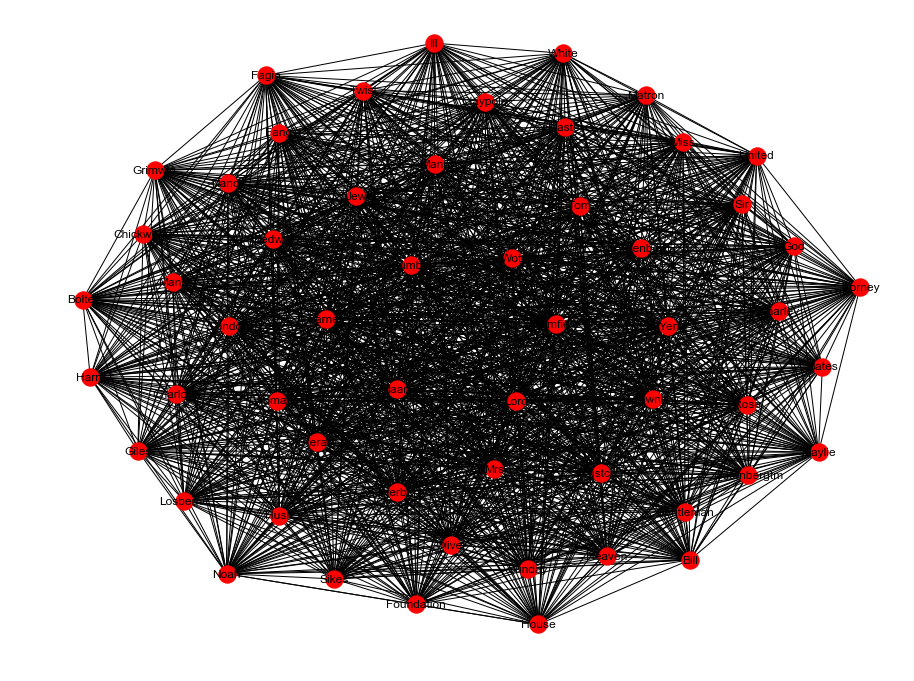

In [323]:
G = nx.from_pandas_edgelist(interaction_df,
                             source='source',
                             target='target')

nx.draw(G, with_labels=True)

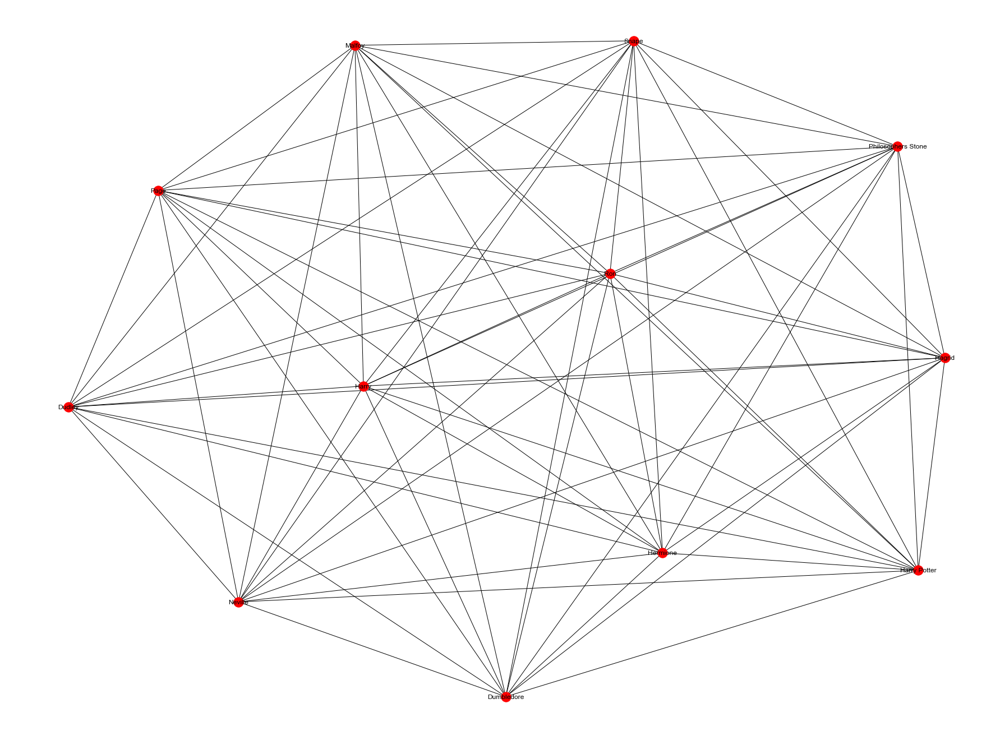

In [365]:
G = nx.from_pandas_edgelist(interaction_df,
                             source='source',
                             target='target')

nx.draw(G, with_labels=True)

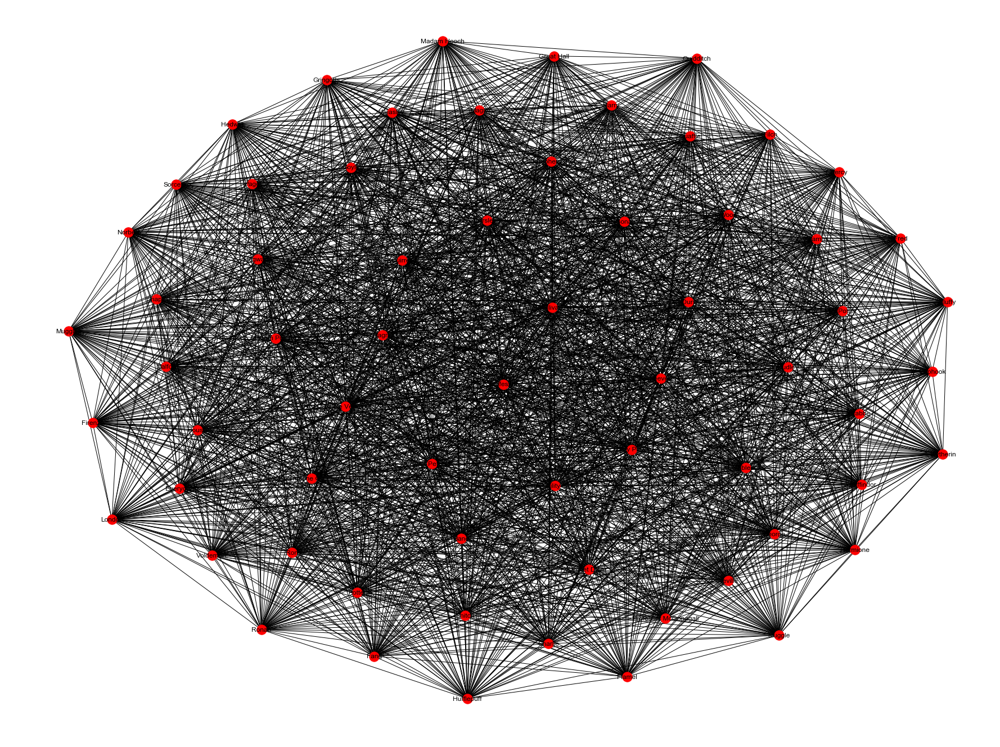

In [333]:
G = nx.from_pandas_edgelist(interaction_df,
                             source='source',
                             target='target')

nx.draw(G, with_labels=True)

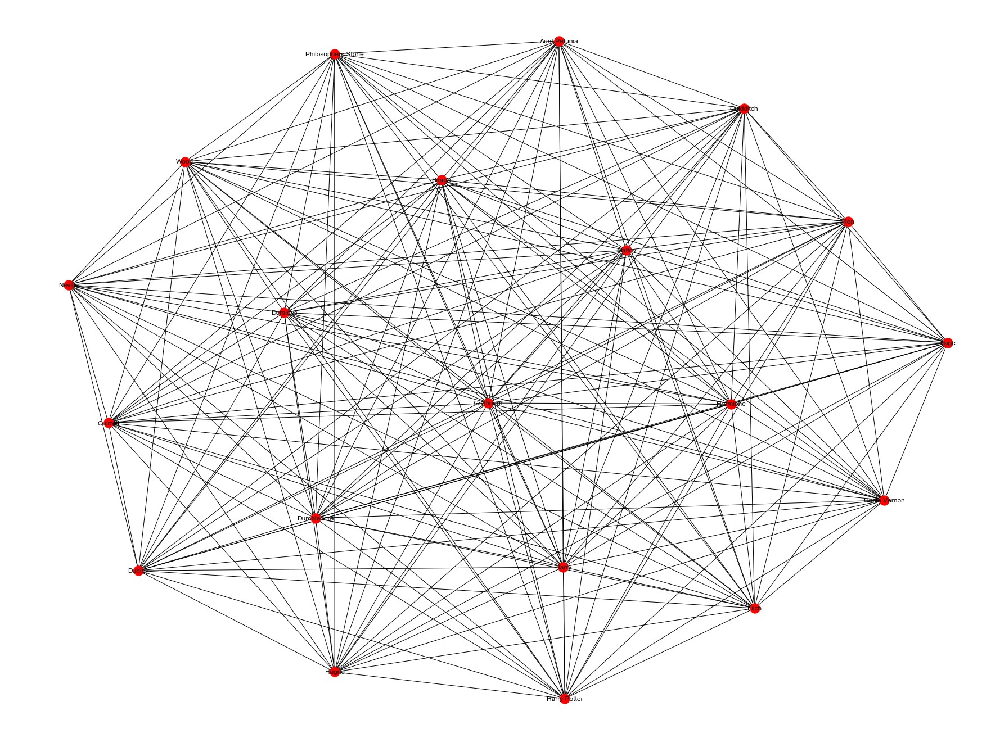

In [356]:
G = nx.from_pandas_edgelist(interaction_df,
                             source='source',
                             target='target')

nx.draw(G, with_labels=True)

In [335]:
import pandas as pd

In [336]:
pd.Series(nx.pagerank(G)).sort_values(ascending=False)[:10]

Gringotts               0.015385
Crabbe                  0.015385
Sorcerer                0.015385
Professor McGonagall    0.015385
Hogwarts                0.015385
Great Hall              0.015385
Page                    0.015385
Slytherin               0.015385
Gryffindor              0.015385
Muggle                  0.015385
dtype: float64

In [366]:
pd.Series(nx.pagerank(G)).sort_values(ascending=False)[:10]

Hermione        0.083333
Dudley          0.083333
Harry           0.083333
Snape           0.083333
Malfoy          0.083333
Ron             0.083333
Hagrid          0.083333
Neville         0.083333
Page            0.083333
Harry Potter    0.083333
dtype: float64

In [ ]:
    '''
    Automatically extracts lists of plausible character names from a book

    Parameters
    ----------
    book : string (required)
        book in string form (with original upper/lowercasing intact)

    Returns
    -------
    characters : list
        list of plasible character names
    '''
    nlp = spacy.load('en')
    stopwords = nltk.corpus.stopwords.words('english')

    words = [remove_punctuation(w) for w in book.split()]
    unique_words = list(set(words))

    characters = [word.text for word in nlp(' '.join(unique_words)) if word.pos_ == 'PROPN']
    characters = [c for c in characters if len(c) > 2]
    characters = [c for c in characters if c.istitle()]
    characters = [c for c in characters if not (c[-1] == 's' and c[:-1] in characters)]
    characters = list(set([c.title() for c in [c.lower() for c in characters]]) - set(stopwords))

    return [tuple([c + ' ']) for c in set(characters)]

In [ ]:
book = load_book('data/raw/fellowship_of_the_ring.txt', lower=False)

In [ ]:
extract_character_names(book)[-10:]

In [ ]:
%%timeit
extract_character_names(book)

In [367]:

import networkx as nx
interaction_df = get_interaction_df(cooccurence, threshold=2)
interaction_df.sample(5)

,source,target,value
55,Ron,Hermione,3016073
25,Harry Potter,Malfoy,8634198
33,Page,Malfoy,2165126
57,Malfoy,Harry,2296048
5,Dumbledore,Ron,3013139


In [369]:
G = nx.from_pandas_edgelist(interaction_df,
                             source='source',
                             target='target')

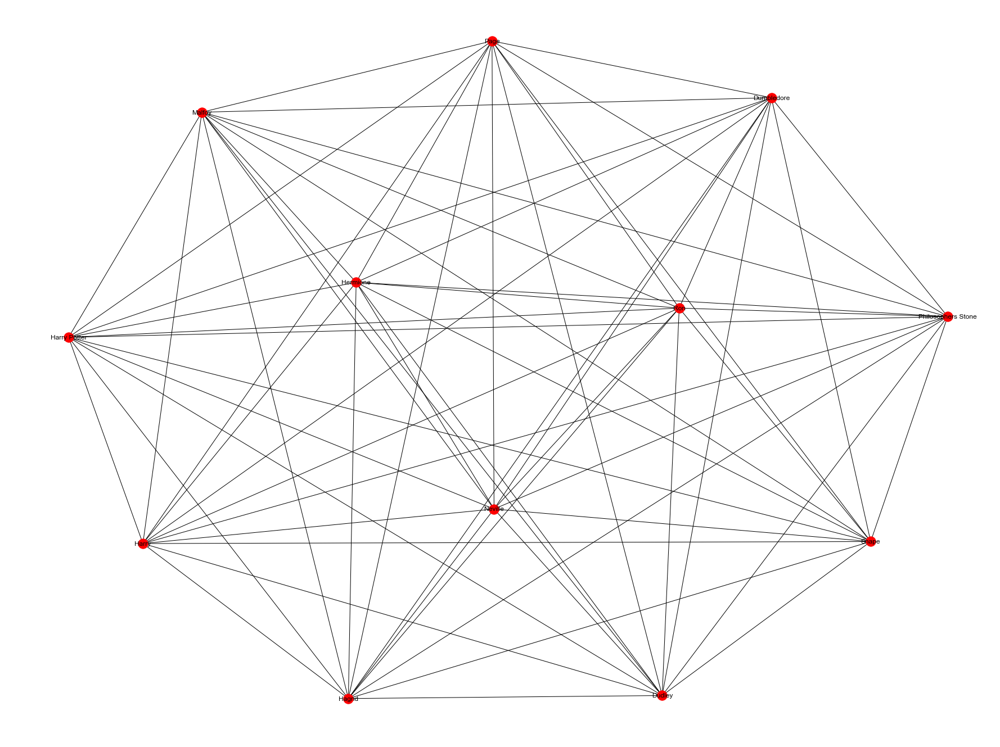

In [370]:
nx.draw_spring(G, with_labels=True)

In [371]:
pd.Series(nx.pagerank(G)).sort_values(ascending=False)[:5]

Hermione    0.083333
Dudley      0.083333
Harry       0.083333
Snape       0.083333
Malfoy      0.083333
dtype: float64

In [372]:
a, b = nx.hits(G)
pd.Series(a).sort_values(ascending=False)[:5]

Hermione    0.083333
Dudley      0.083333
Harry       0.083333
Snape       0.083333
Malfoy      0.083333
dtype: float64

In [373]:
list(nx.enumerate_all_cliques(G))[-1]

['Dumbledore',
 'Philosophers Stone',
 'Harry Potter',
 'Page',
 'Neville',
 'Hagrid',
 'Ron',
 'Malfoy',
 'Snape',
 'Harry',
 'Dudley',
 'Hermione']

In [379]:
comms = nx.communicability(G)
print(comms["Malfoy"]["Dudley"])
print(comms["Ron"]["Hermione"])

4989.481152979712
4989.481152979712


In [1]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [3]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

C:\Users\Dell\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [4]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()


def find_sentiment(doc):
    # find roots of all entities in the text
    ner_heads = {ent.root.idx: ent for ent in doc.ents}
    rule3_pairs = []
    for token in doc:
        children = token.children
        A = "999999"
        M = "999999"
        add_neg_pfx = False
        for child in children:
            if(child.dep_ == "nsubj" and not child.is_stop): # nsubj is nominal subject
                if child.idx in ner_heads:
                    A = ner_heads[child.idx].text
                else:
                    A = child.text
            if(child.dep_ == "acomp" and not child.is_stop): # acomp is adjectival complement
                M = child.text
            # example - 'this could have been better' -> (this, not better)
            if(child.dep_ == "aux" and child.tag_ == "MD"): # MD is modal auxiliary
                neg_prefix = "not"
                add_neg_pfx = True
            if(child.dep_ == "neg"): # neg is negation
                neg_prefix = child.text
                add_neg_pfx = True
        if (add_neg_pfx and M != "999999"):
            M = neg_prefix + " " + M
        if(A != "999999" and M != "999999"):
            rule3_pairs.append((A, M, sid.polarity_scores(M)['compound']))
    return rule3_pairs

print(find_sentiment(nlp("Air France is cool.")))
print(find_sentiment(nlp("I think Gabriel García Márquez is not boring.")))
print(find_sentiment(nlp("They say Central African Republic is really great. ")))

NameError: name 'nlp' is not defined

In [5]:
import en_core_web_sm
nlp = en_core_web_sm.load()

AttributeError: module 'cymem.cymem' has no attribute 'PyMalloc'

In [ ]:
!pip uninstall spacy

In [ ]:
!pip install spacy

In [15]:
from bookworm import *

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,9)

import pandas as pd
import numpy as np
import networkx as nx

In [2]:
!pip install bookworm

  Stored in directory: C:\Users\Dell\AppData\Local\pip\Cache\wheels\ff\b2\9f\3dfdbb3b0161b1d03c7911a1ea1f14ded242fc1a1f9595c507
Successfully built bookworm


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [4]:
import community

In [5]:
pwd

'C:\\Users\\Dell'

In [11]:
import pandas as pd

In [17]:
pwd

'C:\\Users\\Dell\\downloads\\character-extraction-master\\character-extraction-master'